- 주어진 음악 녹음에 대해 중요한 구조적(structural) 요소를 식별하고 이러한 요소에 따라 녹음을 시간적으로 분할(segment)하는 것이 목표이다. 
- 반복(repitition), 동질성(homogeneity) 및 새로움(novelty)을 기반으로 하는 기본 분할 원칙(fundamental segmentation principles)(음악 이외의 다른 유형의 멀티미디어에도 적용되는 원칙)에 대해 논의한다. 
- 또한 자기-유사성 행렬(self-similarity matrix)의 개념을 자세히 연구하고 그것의 구조적 특성에 대해 논의한다. 마지막으로 정밀도, 재현율 및 F-measure의 개념을 소개하면서 평가(evaluation) 주제를 간략하게 다룬다.

In [1]:
import IPython.display as ipd
import librosa
import librosa.display
import numpy as np; import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from scipy import signal
from scipy.interpolate import interp1d

from utils.plot_tools import plot_chromagram, plot_matrix
from utils.feature_tools import smooth_downsample_feature_sequence, normalize_feature_sequence

C:\Users\Cho\anaconda3\envs\mir\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# General Principles

- 음악 구조 분석(music structure analysis)은 다양한 측면에 의존하는 다면적이고 정의가 모호한 문제이다. 우선 문제의 복잡성은 분석할 음악 표현의 종류에 따라 다르다. 예를 들어 악보에서 반복되는 멜로디와 같은 특정 구조를 감지하는 것은 비교적 쉬운 반면 오디오 표현에서는 그것이 어렵다. 둘째, 세분화의 기반이 될 수 있는 **동질성**, **반복**, **새로움** 등 다양한 원칙이 있다. 셋째, 멜로디, 하모니, 리듬 또는 음색과 같은 다양한 음악적 차원을 설명해야 한다. 마지막으로 분할(segmentation)과 구조(structure)는 음악적 맥락과 고려해야 할 **시간적 계층(temporal hierarchy)** 에 따라 크게 달라진다. 
- 다음 그림은 음악 구조를 다룰 때 고려해야 할 다양한 측면에 대한 개요를 제공한다.

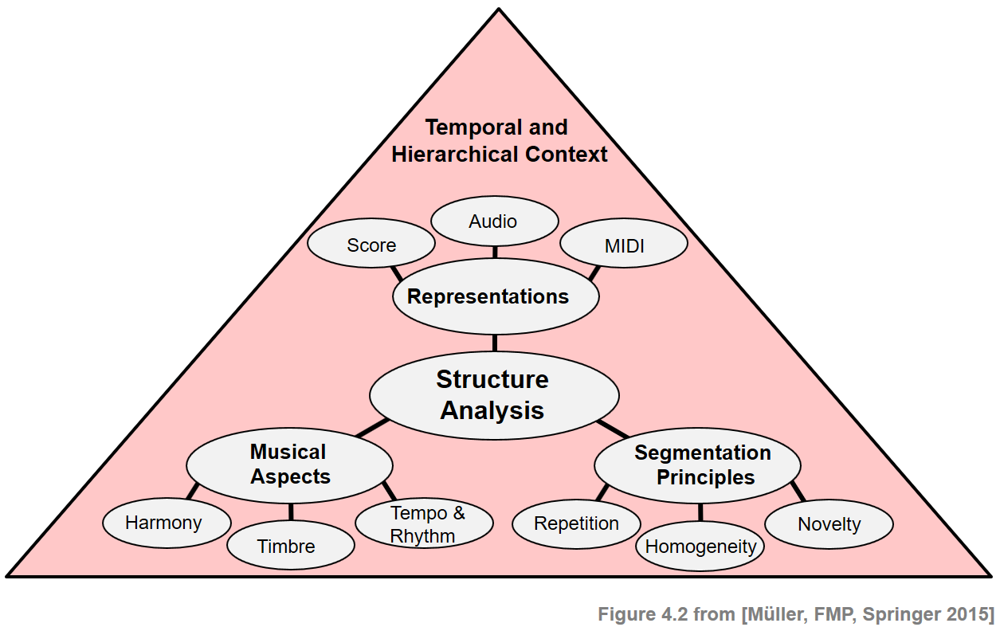

In [2]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F02.png", width=500)

## 세분화와 구조 분석 (Segmentation and Structure Analysis)

- **세분화/분할(Segmentation)** 은 일반적으로 원본 문서보다 더 의미 있고 분석하기 쉬운 것으로 표시를 단순화하기 위해 지정된 문서를 여러 세그먼트로 분할하는 과정을 말한다. 예를 들어 이미지 처리에서 목표는 주어진 이미지를 영역 집합으로 분할하여 각 영역이 색상, 강도 또는 질감과 같은 일부 특성과 관련하여 유사하도록 하는 것이다. 영역 경계는 종종 이미지 밝기 또는 기타 속성이 급격하게 변하고 불연속성을 나타내는 등고선이나 가장자리로 설명될 수 있다. 
- 음악에서 분할 작업은 주어진 오디오 스트림을 음향적으로 의미 있는 **섹션**으로 분해하는 것이다. 각각은 시작 및 종료 **경계(boundary)** 로 지정된 연속 시간 간격에 해당한다. 
- 미세한 수준에서 세분화는 개별 음 사이의 경계를 찾거나 비트 위치에 의해 지정된 비트 간격을 찾는 것을 목표로 할 수 있다. 대략적인 수준에서 목표는 악기나 화음의 변화를 감지하거나 절(verse)과 합창 부분 사이의 경계를 찾는 것일 수 있다. 또한 침묵, 말, 음악을 구별하거나 실제 음악 녹음의 시작 부분을 찾거나 공연이 끝난 후 박수를 분리하는 것이 전형적인 분할 작업이다.

- **구조 분석(structural analysis)** 의 목표는 단순한 분할을 넘어 세그먼트 간의 관계를 찾고 이해하는 것이다. 예를 들어, 특정 세그먼트는 악기에 의해 특징지어질 수 있다. 현악기로만 연주되는 구간이 있을 수 있다. 전체 오케스트라가 연주하는 섹션 다음에 솔로 섹션이 이어질 수 있다. 노래하는 목소리가 있는 절 부분은 순전히 기악 부분으로 대체될 수 있다. 또는 부드럽고 느린 도입부 부분이 훨씬 빠른 템포로 연주되는 메인 테마 앞에 나올 수 있다. 
- 또한 섹션이 자주 반복된다. 대부분의 음악 관련 이벤트는 어떤 식으로든 반복됩니다. 그러나 반복은 원래 섹션과 거의 동일하지 않으며 가사, 악기 또는 멜로디와 같은 측면에서 수정된다. 구조 분석의 주요 작업 중 하나는 주어진 음악 녹음을 분할하는 것뿐만 아니라 세그먼트를 음악적으로 의미 있는 범주(예: 인트로, 코러스, 절, 아웃트로)로 그룹화하는 것이다.

- 전산 음악 구조 분석의 문제는 음악의 구조가 **반복**, **대조**, **변형** 및 **동질성**을 비롯한 다양한 종류의 **관계**에서 발생한다는 것이다. 음악 구조에 결정적으로 영향을 미치는 다양한 원리를 고려하여 음악 구조 분석에 대한 다양한 접근 방식이 많이 개발되었다. 세 가지 방법 분류를 대략적으로 구분해보자.

    * 첫째, **반복(repetition) 기반** 방법은 반복 패턴을 식별하는 데 사용된다.
    * 둘째, **새로움(novelty) 기반** 방법을 사용하여 대조되는 부분 간의 전환을 감지한다.
    * 셋째, **동질성(homogeneity) 기반** 방법은 일부 음악적 속성과 관련하여 일관된 구절을 결정하는 데 사용된다.

- 새로움 기반 및 동질성 기반 접근 방식은 동전의 양면 같다. 새로움 감지는 더 동질적인 세그먼트 이후의 놀라운 이벤트 또는 변화를 관찰하는 것을 기반으로 한다. 새로움 감지의 목적은 변경 사항의 시간 위치를 찾는 것이지만 동질성 분석의 초점은 일부 음악적 속성과 관련하여 일관성 있는 더 긴 악절을 식별하는 데 있다. 

- 다음 그림은 유사한 세분화 및 구조화 원칙이 이미지 및 3D 데이터와 같은 다른 도메인에 적용됨을 보여준다.

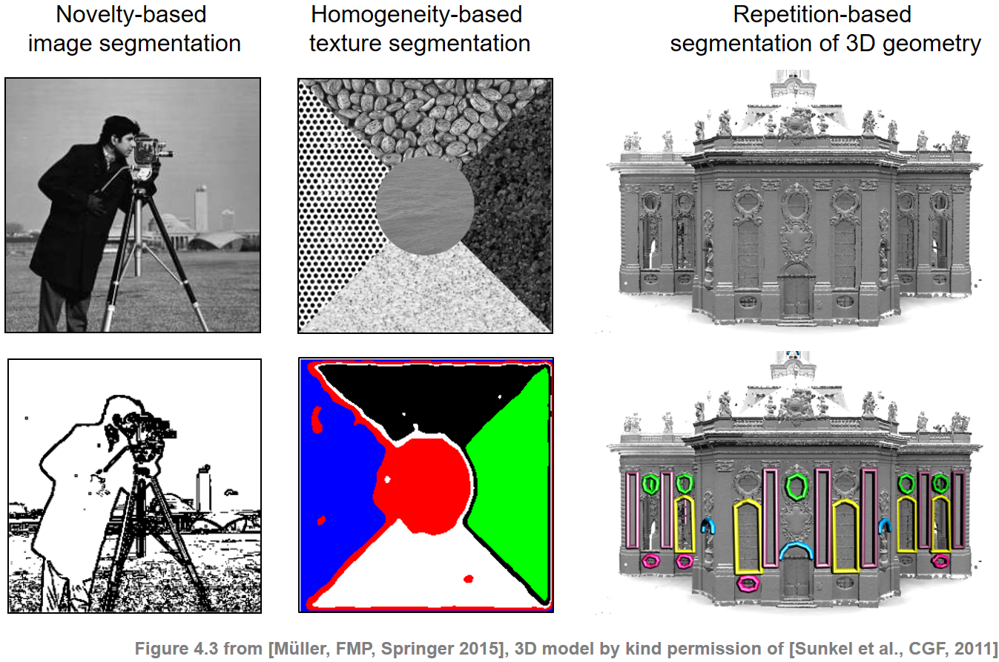

In [3]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F03_text.png", width=600)

## 음악 구조 (Musical Structure)

- 음악 구조를 구체화하기 위해 몇 가지 용어를 소개한다. 먼저 **a piece of music**(추상적인 의미)와 특정 **audio recording**(실제 연주)을 구분해야 한다. **파트(part)** 라는 용어는 추상적인 음악 영역에서 사용되는 반면 **세그먼트(segment)** 라는 용어는 오디오 영역에서 사용된다. 
- 음악적 파트는 일반적으로 처음 나타나는 순서대로 대문자 $A,B,C,\ldots$로 표시되며 여기서 숫자(종종 아래 첨자로 표시됨)는 반복되는 순서를 나타낸다. 
- 예를 들어 요하네스 브람스의 헝가리 무곡 5번을 생각해보자. 이 춤은 피아노 버전에서 풀 오케스트라 버전에 이르기까지 다양한 악기와 앙상블을 위해 편곡되었다. 다음 그림은 전체 오케스트라를 위한 편곡의 바이올린 음성에 대한 악보 표현을 보여준다.

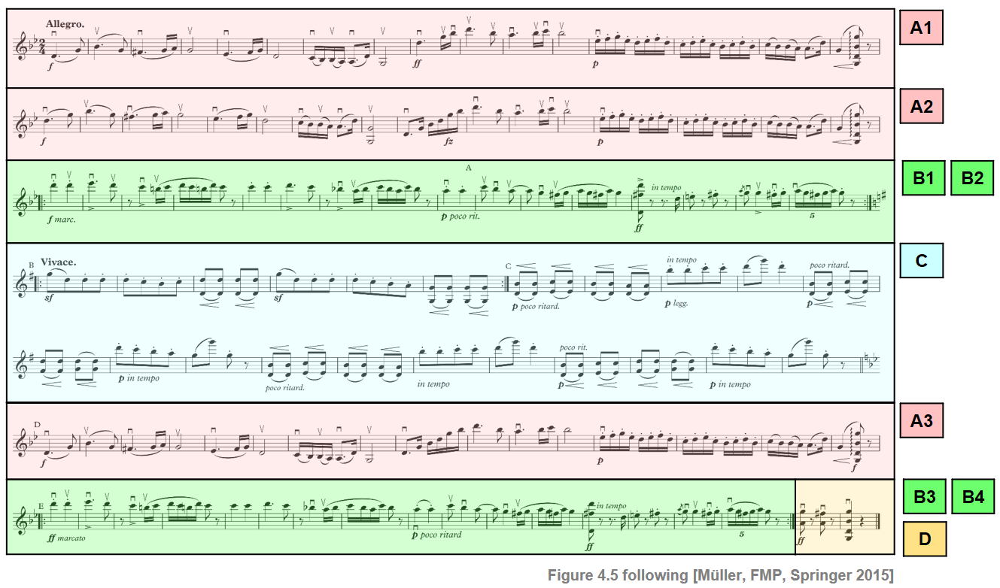

In [4]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F05_Sibelius_annotated.png", width=600)

- 음악적 구조는 $A_1A_2B_1B_2CA_3B_3B_4D$로 $A$ 파트 3개, $B$ 파트 4개, $C$ 파트 1개, 닫는 $D$ 파트 1개로 구성되어 있다. $A$ 부분에는 두 개 이상 반복되는 하위 부분으로 구성된 하위 구조가 있다. 또한 악보를 보면 알 수 있듯이 중간 $C$ 부분은 $d_1d_2e_1e_2e_3e_4$로 설명할 수 있는 하위 구조로 더 세분화될 수 있다. 악보에서 이러한 하위 부분은 종종 소문자 $a,b,c,\ldots$를 사용하여 표시된다.

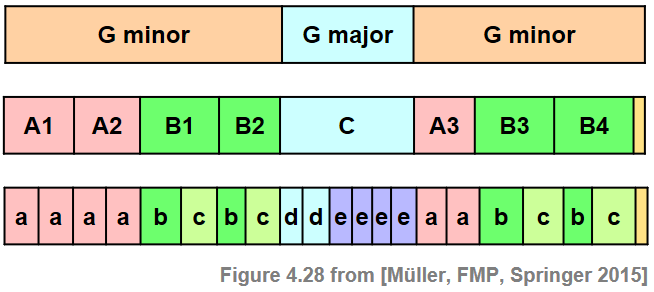

In [5]:
ipd.Image("../img/5.music_structure_analysis/FMP_C4_F28.png", width=400)

# 음악적 차원 (Musical Dimensions)

- 다양한 분할 원리의 적용 가능성은 분석할 오디오 신호의 음악적 및 음향적 특성에 크게 좌우된다. 예를 들어, 구조적 경계는 화음, 음색 또는 템포의 변화를 기반으로 할 수 있다. 자동화된 
- 구조 분석의 첫 번째 단계는 주어진 음악 녹음을 관련 음악 속성을 캡처하는 적절한 **feature 표현**으로 변환하는 것이다. 다음에서는 세 가지 다른 유형의 기능 표현(크로마그램, MFFC, 템포그램)을 살펴본다. 
- 특히 단일 feature 유형의 경우에도 feature 표현 품질에 상당한 영향을 미치는 많은 변형과 다양한 매개변수 설정이 있음을 보여준다.

In [6]:
# for mp3 files
import audioread.ffdec
mp3 = audioread.ffdec.FFmpegAudioFile('../audio/brahms_hungarian_dance_5.mp3')
x, Fs = librosa.load(mp3)
ipd.Audio(x,rate=Fs)

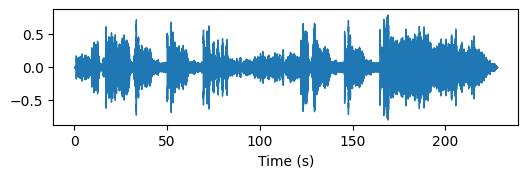

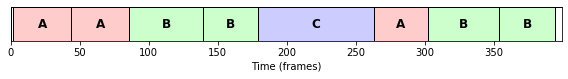

In [7]:
plt.figure(figsize=(6,1.5))
librosa.display.waveshow(y=x, sr=Fs, x_axis='s')
plt.show()

ipd.Image("../img/5.music_structure_analysis/c4s1.segment_example.png")
# 다만 두 그림의 시간은 일치하지 않는다. (녹음 파일은 뒤에 1분 가량의 박수소리가 있음)

## 크로마그램

- 첫째, **크로마-기반 표현**은 음악 녹음의 **화음(harmonic)** 및 **선율 속성(melodic properties)** 과 관련된다. 
- 크로마그램에서 볼 수 있는 패턴은 중요한 구조 정보를 나타낸다. 

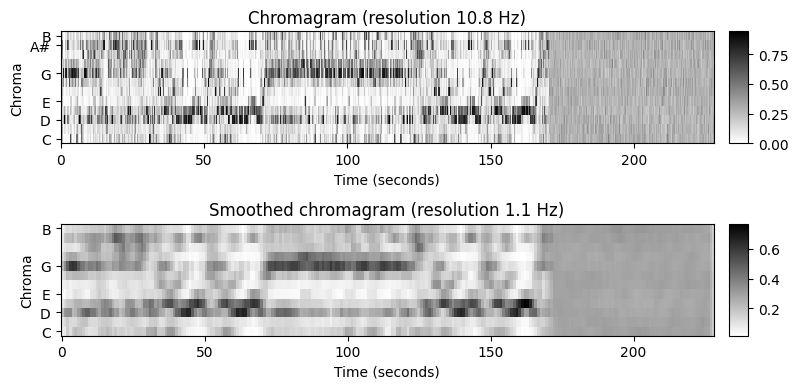

In [8]:
# Chromagram
N, H = 4096, 2048
chromagram = librosa.feature.chroma_stft(y=x, sr=Fs, tuning=0, norm=2, hop_length=H, n_fft=N)

filt_len = 41
down_sampling = 10
filt_kernel = np.ones([1,filt_len])
chromagram_smooth =  signal.convolve(chromagram, filt_kernel, mode='same')/filt_len
chromagram_smooth = chromagram_smooth[:,::down_sampling]
chromagram_smooth, Fs_smooth = smooth_downsample_feature_sequence(chromagram, 
                        Fs/H, filt_len=filt_len, down_sampling=down_sampling)

# Visualization
fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [1, 1]}, figsize=(8, 4))       
plot_chromagram(chromagram, Fs=Fs/H, ax=[ax[0,0], ax[0,1]],  
                         chroma_yticks = [0,2,4,7,10,11], 
                         title='Chromagram (resolution %0.1f Hz)'%(Fs/H), 
                         ylabel='Chroma', colorbar=True);
plot_chromagram(chromagram_smooth, Fs_smooth, ax=[ax[1,0], ax[1,1]],  
                         chroma_yticks = [0,2,4,7,11], 
                         title='Smoothed chromagram (resolution %0.1f Hz)'%Fs_smooth, 
                         ylabel='Chroma', colorbar=True);

plt.tight_layout()

- AABBCABB
- 4개의 반복되는 $B$ 부분 세그먼트는 크로마그램에서 4개의 유사한 특성 하위 시퀀스로 명확하게 표시된다. 
- 또한 $C$ 부분 세그먼트는 전체 섹션에서 높은 수준의 동질성을 보여줌으로써 크로마그램에서 두드러진다. 실제로 이 세그먼트의 모든 크로마 기능에 대해 대부분의 신호 에너지는 $\mathrm{G}$-, $\mathrm{B}$- 및 $\mathrm{D}$-대역에 포함된다(이는 $C$ 부분이 $\mathrm{G}$ major에 있기 때문에 놀라운 일은 아니다). 
- 대조적으로, $A$ 부분 세그먼트의 경우 많은 크로마 벡터가 $\mathrm{G}$-, $\mathrm{B}^\flat$- 및 $\mathrm{D}$에 지배적으로 분포한다.

## MFCC 표현

- 멜로디와 하모니 외에도 악기와 음색(timbre)의 특성은 음악 구조에 대한 인간의 인식에 매우 중요하다. 
- 음색 기반 구조 분석의 맥락에서 원래 자동 음성 인식용으로 개발된 **MFCC(mel-frequency cepstral coefficients)** 를 자주 사용한다. 
- 음악의 경우 MFFC 기반 기능은 **악기** 및 **음색**과 같은 측면과 상관관계가 있는 중간 수준(mid-level)의 표현이다. 

-  노래하는 목소리가 있는 섹션이 순전히 악기 또는 타악기 섹션과 번갈아 나타나는 팝송과 같은 많은 음악 녹음의 경우 MFCC 기반 기능 표현은 새로움 기반 및 동질성 기반 세분화에 매우 적합하다.

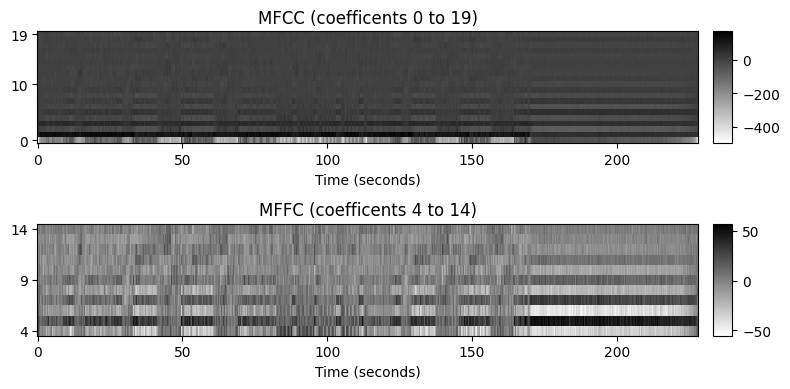

In [9]:
# MFCC
N, H = 4096, 2048
X_MFCC = librosa.feature.mfcc(y=x, sr=Fs, hop_length=H, n_fft=N)
coef = np.arange(4,15)
X_MFCC_upper = X_MFCC[coef,:]

# Visualization
fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [1, 1]}, figsize=(8, 4))       
plot_matrix(X_MFCC, Fs=Fs/H, ax=[ax[0,0], ax[0,1]], 
                     title='MFCC (coefficents 0 to 19)', ylabel='', colorbar=True);
ax[0,0].set_yticks([0, 10, 19])
plot_matrix(X_MFCC_upper, Fs=Fs/H, ax=[ax[1,0], ax[1,1]], 
                     title='MFFC (coefficents 4 to 14)', ylabel='', colorbar=True);
ax[1,0].set_yticks([0, 5, 10])
ax[1,0].set_yticklabels(coef[0] + [0, 5, 10])


plt.tight_layout()

- $A$ 부분 세그먼트 내의 MFCC 기능이 $B$ 부분 및 $C$ 부분 세그먼트의 기능과 다르다는 것을 인식할 수 있다.

## 템포그램 (Tempogram) 표현

- 음악 구조 분석에서 템포 및 비트 정보는 동질성 기반 세분화 접근 방식과 함께 사용될 수도 있다. 이러한 정보를 명시적으로 추출하는 대신, 템포 및 리듬과 관련된 중간-수준의 피쳐 표현으로 더 높은 구조 수준에서 의미 있는 세분화를 유도하는 데 충분할 수 있다. 
- 로컬 **템포 정보**를 인코딩하는 중간-수준 표현인 **템포그램**을 사용한다. 
- 템포그램의 순환 변형이 표시되며 여기서 2의 거듭제곱 차이가 나는 템포가 식별된다. 옥타브별로 다른 피치가 식별되는 순환 크로마 기능과 유사하다. 템포그램 표현을 살펴보면 다양한 음악 파트가 다른 템포로 연주된다는 것을 알 수 있다(표현이 정확한 템포를 나타내지는 않지만). 또한 템포그램 피쳐에 지배적인 항목이 없는 섹션이 있는데, 이는 녹음에 템포에 대한 명확한 개념이 없음을 나타낼 수 있다.

(자세한 것은 다음 챕터에서 다룬다.)

In [10]:
import utils.tempo_tools as tmpo

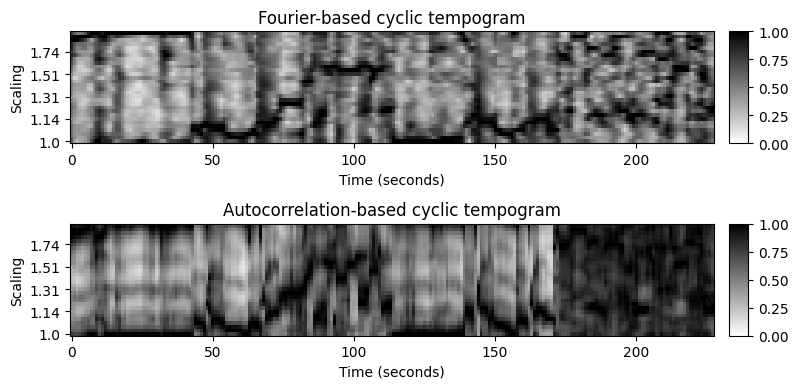

In [11]:
# Tempogram
nov, Fs_nov = tmpo.compute_novelty_spectrum(x, Fs=Fs, N=2048, H=512, gamma=100, M=10, norm=True)
nov, Fs_nov = tmpo.resample_signal(nov, Fs_in=Fs_nov, Fs_out=100)

X, T_coef, F_coef_BPM = tmpo.compute_tempogram_fourier(nov, Fs_nov, N=1000, H=100, Theta=np.arange(30, 601))

octave_bin = 30
tempogram_F = np.abs(X)
output = tmpo.compute_cyclic_tempogram(tempogram_F, F_coef_BPM, octave_bin=octave_bin)
tempogram_cyclic_F = output[0]
F_coef_scale = output[1]
tempogram_cyclic_F = normalize_feature_sequence(tempogram_cyclic_F, norm='max')

output = tmpo.compute_tempogram_autocorr(nov, Fs_nov, N=500, H=100, norm_sum=False,
                                              Theta=np.arange(30, 601))
tempogram_A = output[0]
T_coef = output[1]
F_coef_BPM = output[2]

output = tmpo.compute_cyclic_tempogram(tempogram_A, F_coef_BPM, octave_bin=octave_bin)
tempogram_cyclic_A = output[0]
F_coef_scale = output[1]
tempogram_cyclic_A = normalize_feature_sequence(tempogram_cyclic_A, norm='max')

# Visualization
fig, ax = plt.subplots(2, 2, gridspec_kw={'width_ratios': [1, 0.03], 
                                          'height_ratios': [1,1]}, figsize=(8,4))       

plot_matrix(tempogram_cyclic_F, T_coef=T_coef, ax=[ax[0,0], ax[0,1]], 
                     title='Fourier-based cyclic tempogram', ylabel='Scaling',
                     colorbar=True, clim=[0, 1])
tmpo.set_yticks_tempogram_cyclic(ax[0,0], octave_bin, F_coef_scale, num_tick=5)

plot_matrix(tempogram_cyclic_A, T_coef=T_coef, ax=[ax[1,0], ax[1,1]], 
                     title='Autocorrelation-based cyclic tempogram', ylabel='Scaling',
                     colorbar=True, clim=[0, 1])
tmpo.set_yticks_tempogram_cyclic(ax[1,0], octave_bin, F_coef_scale, num_tick=5)



plt.tight_layout()

**further notes**

- 다양한 음악적 차원 외에도 적절한 특징 표현을 찾을 때 염두에 두어야 할 또 다른 측면이 있다. 바로 시간적(temporal) 차원이다. 위에서 언급한 모든 특징 표현에서 분석 창(winodw)은 음악 신호 위로 이동한다. 분명히 분석 창의 길이와 홉 크기 매개변수는 특징 표현의 품질에 결정적인 영향을 미친다. 예를 들어 긴 창 크기와 큰 홉 크기는 동질성 기반 분할에서 종종 원하는 속성인 관련 없는 로컬 변형을 부드럽게 하는 데 도움이 될 수 있다. 단점은 시간적 해상도가 감소하고 중요한 세부 정보가 손실될 수 있어 정확한 분할 경계를 찾을 때 문제가 발생할 수 있다는 것이다.
- 요약하면 기능 표현 및 매개변수 설정의 적절한 선택은 응용 맥락에 따라 크게 달라진다. 음악 구조의 풍부함과 다양성은 전산 구조 분석을 어렵게 한다.